In [1]:
import numpy as np
import os
import sys
import xarray as xr
import matplotlib.pyplot as plt

This notebook contains scripts to generate fes data. And also scripts with computations associated with Canada model etc.

In [2]:
def runfes2netcdf(filename,tstart,tstop):
    command="sh fes2netcdf.sh "+filename+" "+tstart+" "+tstop
    print (command)
    os.system(command)

In [3]:
tstart='201212250000'
tstop ='201302010000'
boundaryxyn='Altimetry_boundary_obs/Altimetry_shiftedboundary_obs.xyn'
runfes2netcdf(boundaryxyn,tstart,tstop)

sh fes2netcdf.sh Altimetry_boundary_obs/Altimetry_shiftedboundary_obs.xyn 201212250000 201302010000


In [6]:
data=xr.open_dataset('fes10km_5e-2_obs.nc')
# data.info()

In [7]:
h=data.tide.values
lon=data.lon.values
lat=data.lat.values
time=data.time.values

print(time.shape)

(5473,)


-59.882812
50.330624
(5473,)
-59.21069
50.330624
(5473,)
-58.539112
50.330624
(5473,)
-57.867336
50.330624
(5473,)
-57.197155
50.330624
(5473,)
-56.526596
50.330624
(5473,)
-55.85851
50.330624
(5473,)
-55.189915
50.330624
(5473,)
-54.524426
50.330624
(5473,)
-53.85835
50.330624
(5473,)
-53.195683
50.330624
(5473,)
-52.532413
50.330624
(5473,)
-51.8725
50.330624
(5473,)
-51.212032
50.330624
(5473,)
-50.554493
50.330624
(5473,)
-49.896503
50.330624
(5473,)
-49.24068
50.330624
(5473,)
-48.584568
50.330624
(5473,)
-47.929604
50.330624
(5473,)
-47.27454
50.330624
(5473,)
-47.049374
50.495285
(5473,)


<ipython-input-8-95179594764c>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig=plt.figure()


-47.049374
50.93711
(5473,)
-47.049374
51.37972
(5473,)
-47.049374
51.822014
(5473,)
-47.049374
52.266567
(5473,)
-47.049374
52.71051
(5473,)
-47.049374
53.15792
(5473,)
-47.049374
53.60447
(5473,)
-47.049374
54.055305
(5473,)
-47.049374
54.50508
(5473,)
-47.049374
54.959515
(5473,)
-47.049374
55.41278
(5473,)
-47.049374
55.870644
(5473,)
-47.049374
56.32731
(5473,)
-47.049374
56.78817
(5473,)
-47.049374
57.247883
(5473,)
-47.049374
57.711132
(5473,)
-47.049374
58.17338
(5473,)
-47.049374
58.638348
(5473,)
-47.049374
59.10254
(5473,)
-47.049374
59.568558
(5473,)
-47.049374
60.03408
(5473,)
-47.049374
60.500523
(5473,)
-47.049374
60.966797
(5473,)
-59.94
81.91406
(5473,)
-59.94
82.55859
(5473,)
-59.94
83.14912
(5473,)
-60.14892
83.26312
(5473,)
-61.697006
83.26312
(5473,)
-63.244984
83.26312
(5473,)
-64.793076
83.26312
(5473,)
-66.34083
83.26312
(5473,)
-67.88883
83.26312
(5473,)
-69.43628
83.26312
(5473,)
-70.98412
83.26312
(5473,)
-72.53121
83.26312
(5473,)
-74.078865
83.26312
(5473,)

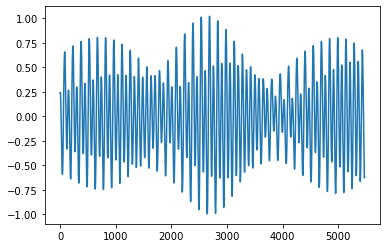

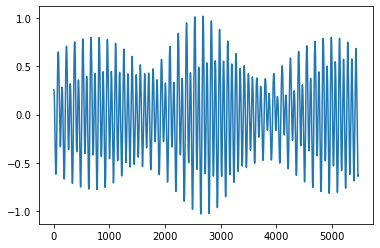

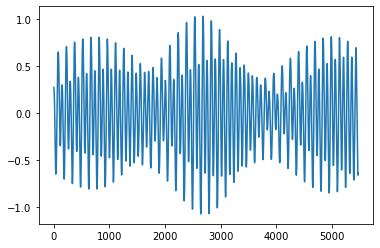

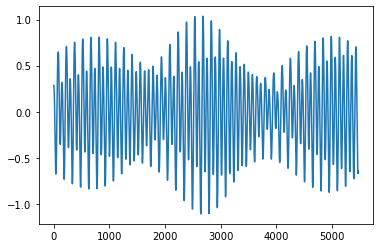

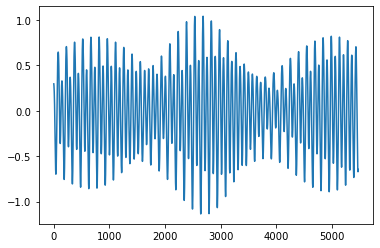

...

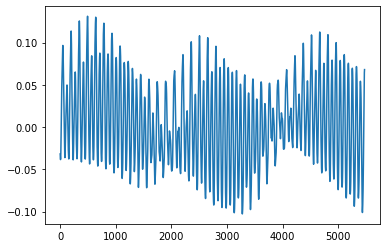

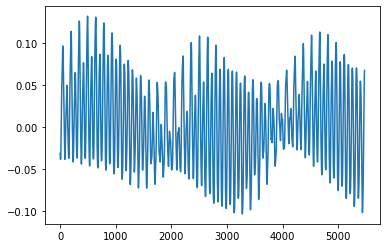

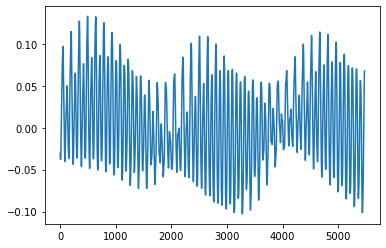

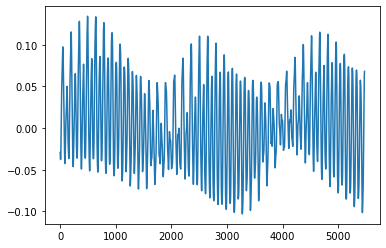

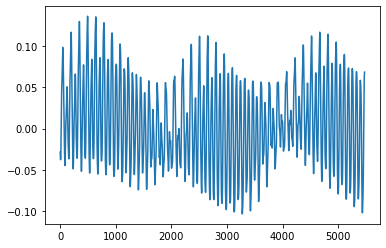

In [8]:
i=0
for i in range(len(lon)):
    print(lon[i])
    print(lat[i])
    timeseries=h[:,i]
    print(timeseries.shape)
    fig=plt.figure()
    plt.plot(timeseries)
    plt.savefig(str(i)+'.jpg')

In [8]:
timemins=np.linspace(0,(len(time)-1)*10,5473) #5473 for one month 
# timemins=np.linspace(0,(len(time)-1)*10,289) 
print(timemins[-1])

54720.0


In [9]:
def writeheader(file,boundname):
    with open('boundarytrial.bc','r') as f:
        i=0
        for line in f:
            if i==1:
                file.write('Name                            = '+boundname+'\n')
            else:
                file.write(line)
            i+=1
        file.write('\n')

In [10]:
newfile='waterlevel10km_5e-2_month.bc'
nfileobj=open(newfile,'w')
i=0
for i in range(len(lon)):
    if i<198:
        boundname='right_boundary_0'+"{:03d}".format(i+1)
    else:
        boundname='left_boundary_0'+"{:03d}".format(i-197)        
    writeheader(nfileobj,boundname)
    for j in range(len(time)):
        nfileobj.write(str(timemins[j])+'  '+str(h[j,i])+'\n')
    
nfileobj.close()

Getting the points from Inger's Altimetry for our canada region.

[[-37.001953   65.490642 ]
 [-94.086914   58.784179 ]
 [  8.717      53.867    ]
 ...
 [-46.006865   57.992308 ]
 [-45.988599   58.996472 ]
 [-46.054864   59.7397455]]


(743, 2)
(743,)


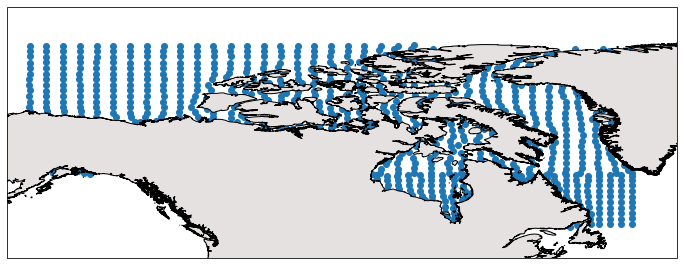

(743, 3)
[['-94.086914' '58.784179' "'churchill'"]
 ['-51.123047' '69.213865' "'ilulissat'"]
 ['-51.72' '64.172' "'nuuk'"]
 ...
 ['-48.031063' '58.00794' "'3902'"]
 ['-47.995574' '58.9792085' "'3903'"]
 ['-47.985199' '59.735881' "'3904'"]]
